In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import sys
import matplotlib.pyplot as plt

sys.path.insert(1, '/cndd3/dburrows/CODE/admin_tools/')
from admin_tools import admin_functions as adm

# Preprocess data

In [2]:
data_path = '/cndd3/dburrows/DATA/neurotransmitter_switch/processed/pilot/combined/cellranger/outs/filtered_feature_bc_matrix'
adata = sc.read_10x_mtx(data_path)

#Calculate QC metrics
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [7]:
adata

AnnData object with n_obs × n_vars = 20011 × 41384
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts'

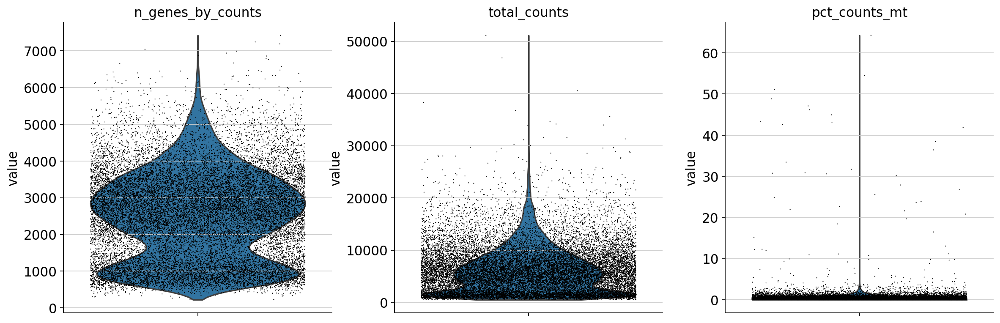

In [8]:
##QC -> by cell statistics
##========================
sc.set_figure_params(figsize=(8,5))

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)


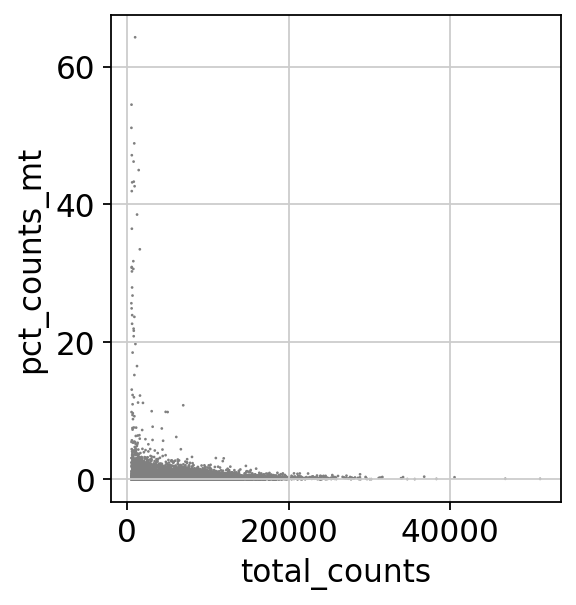

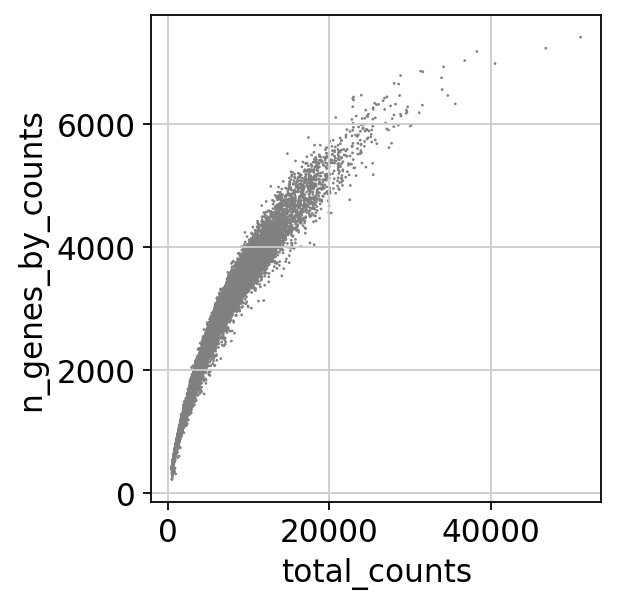

In [9]:
##QC -> by cell statistics; cell total counts x 
##========================
sc.set_figure_params(figsize=(4,4))
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [10]:
#Process
##========================

#Filter based on QC
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_cells(adata, max_genes=5000)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[adata.obs.pct_counts_mt < 5, :]
adata.raw = adata


#Normalise
sc.pp.normalize_total(adata, target_sum=1e6)

#Log1p
sc.pp.log1p(adata)

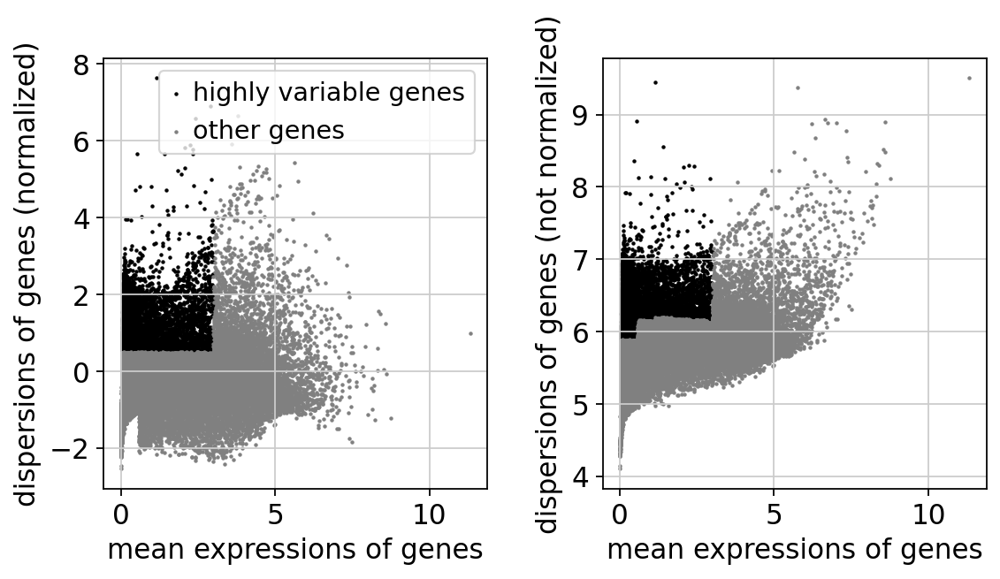

/tmp/ipykernel_2888548/491990853.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.var.highly_variable[i] = True


In [12]:
#Filter to only highly expressed + marker genes -> NB this may need to be tweaked
#Define marker genes
gaba_mark = ['Gad2', 'Gad1','Slc32a1']
glu_mark = ['Slc17a7', 'Slc17a6']
astro_mark = ['Gfap', 'Aldh1l1', 'S100b', 'Aqp4']
oli_mark = ['Mbp', 'Mog', 'Cnp', 'Plp1','Sox10', 'Olig2', 'Olig1']
mi_mark = ['Aif1', 'Cd68', 'Tmem119', 'P2ry12', 'Ptprc']
opc_mark = ['Sox10', 'Olig2', 'Olig1']

comb_l = gaba_mark+glu_mark+astro_mark+oli_mark+mi_mark+opc_mark

#Plot variable vs non variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

#Add in all marker genes
for i in comb_l:
    if adata.var.highly_variable[i] == False: 
        adata.var.highly_variable[i] = True

#Retain only most variable genes
fdata = adata[:,adata.var.highly_variable]
# sc.pp.regress_out(fdata, ['total_counts', 'pct_counts_mt'])
# sc.pp.scale(fdata, max_value=10)


In [13]:
fdata

View of AnnData object with n_obs × n_vars = 19519 × 4652
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


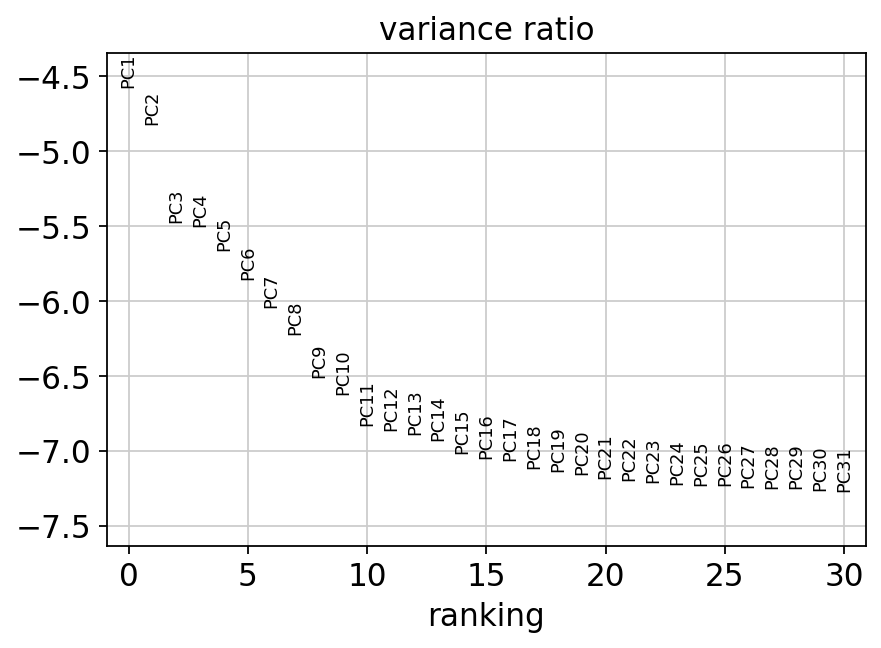

In [14]:
#PCA
sc.set_figure_params(figsize=(6,4))
sc.pp.scale(fdata, max_value=20) #scale data for PCA
sc.tl.pca(fdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(fdata, log=True)

In [ ]:
#Do doublet detection with scrublet
import anndata as ad

# Create a new AnnData object from adata.raw
adata_raw = ad.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs)
sc.external.pp.scrublet(adata_raw)

fdata.obs['doublet_score_raw'] = adata_raw.obs['doublet_score']
fdata.obs['predicted_doublets_raw'] = adata_raw.obs['predicted_doublet']

# Cluster data


In [15]:
#UMAP embedding
sc.pp.neighbors(fdata, n_neighbors=10, n_pcs=20)
sc.tl.umap(fdata)
#Louvain clustering
sc.tl.louvain(fdata)

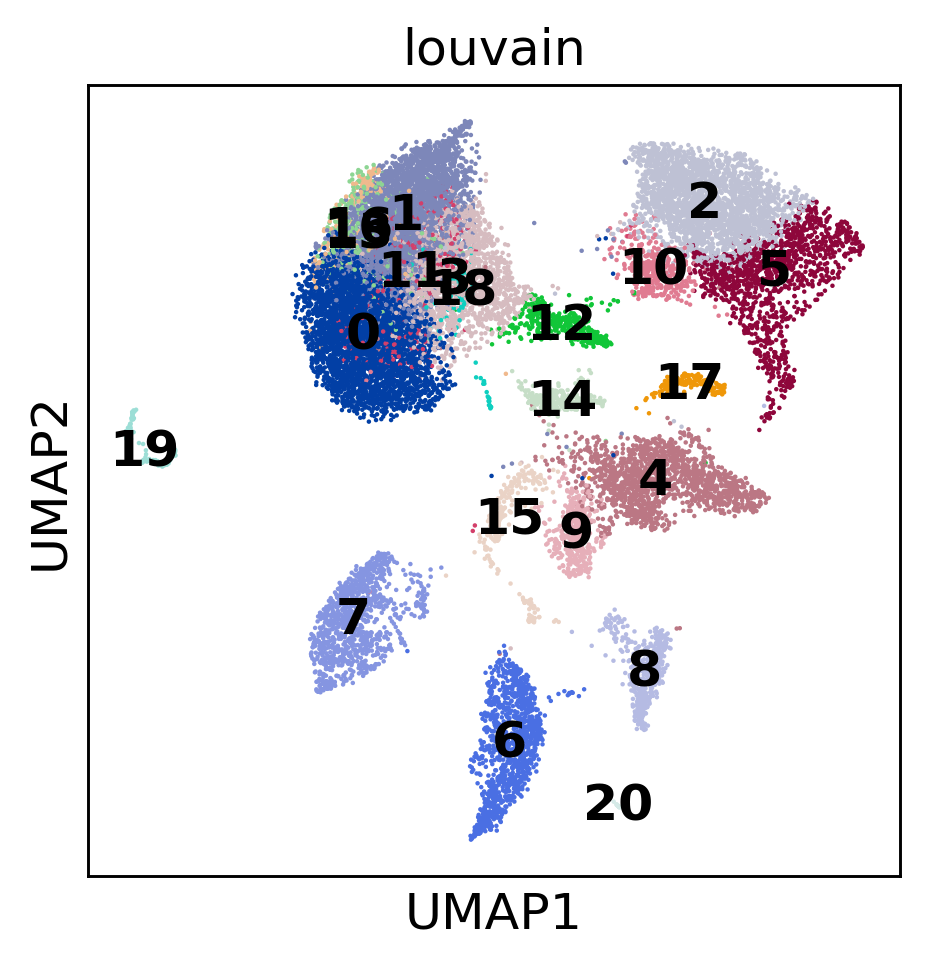

In [16]:
# UMAP by cluster, glu and gaba markers
sc.set_figure_params(figsize=(3,3))
sc.set_figure_params(dpi=130)
sc.pl.umap(fdata,color=['louvain'],legend_loc='on data')

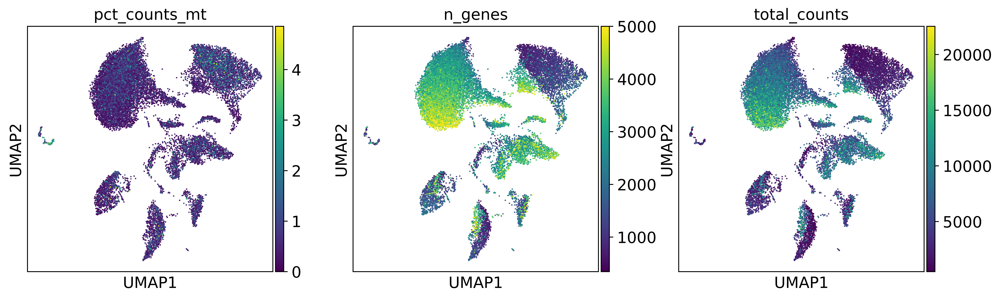

In [17]:
# UMAP by cluster, sample and donor
sc.set_figure_params(figsize=(18,14))
sc.set_figure_params(dpi=500)
sc.pl.umap(fdata,color=['pct_counts_mt', 'n_genes', 'total_counts'],legend_loc='on data')

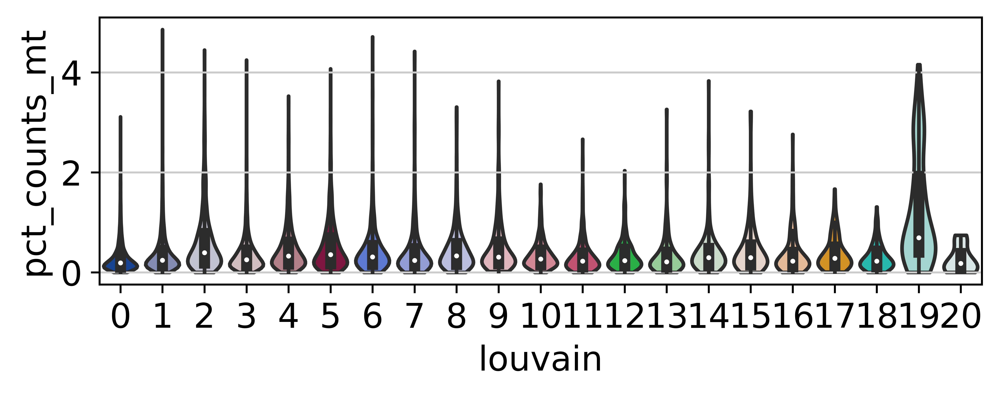

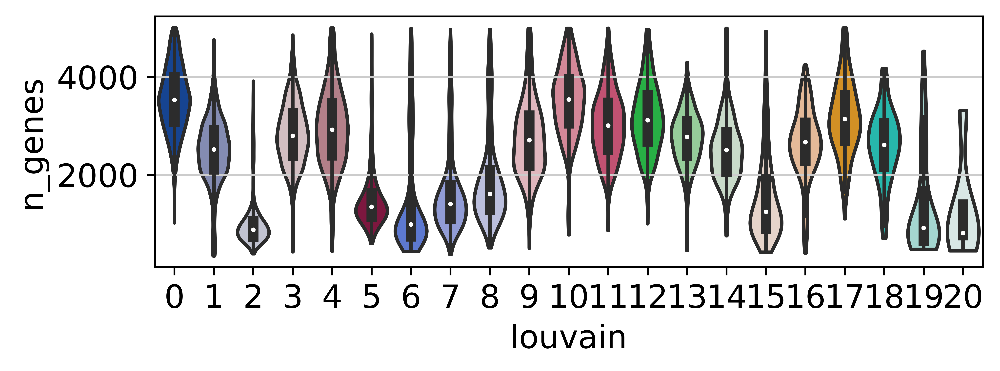

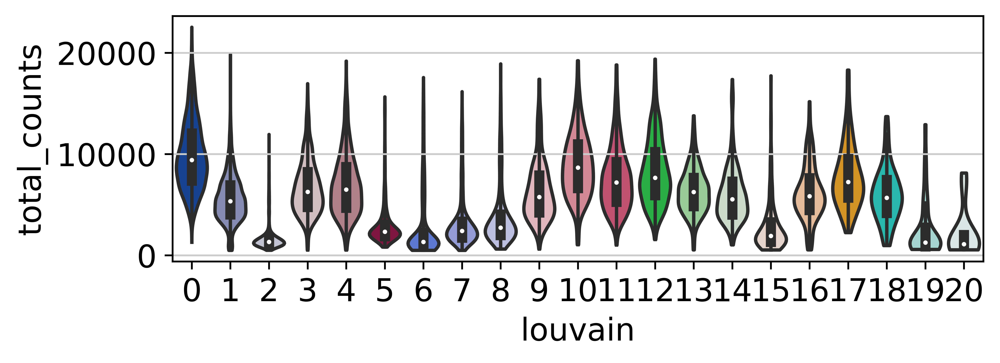

In [18]:
import seaborn as sns
from matplotlib.pyplot import rc_context
# Cluster metrics

with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['pct_counts_mt'], groupby='louvain', stripplot=False, inner='box')  
    
with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['n_genes'], groupby='louvain', stripplot=False, inner='box')  

with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['total_counts'], groupby='louvain', stripplot=False, inner='box')  


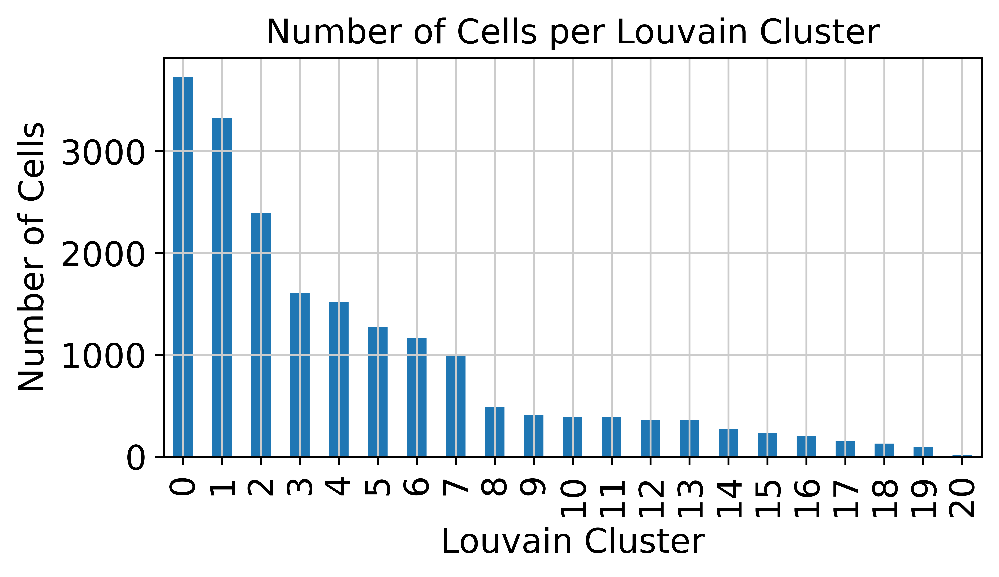

In [19]:
fig,ax = plt.subplots(figsize=(6,3))
cluster_counts = fdata.obs['louvain'].value_counts()

# Sort the clusters
cluster_counts = cluster_counts.sort_index()

# Create a bar plot
cluster_counts.plot(kind='bar')
plt.xlabel('Louvain Cluster')
plt.ylabel('Number of Cells')
plt.title('Number of Cells per Louvain Cluster')
plt.show()

In [21]:
print_l = gaba_mark,glu_mark,astro_mark,oli_mark,mi_mark,opc_mark
name_l = ['Gaba','Glu','Astro', 'Oli', 'Micro', 'OPC']
for x,i in enumerate(print_l):print(f'{name_l[x]}: {i}')

# Look at expression of Gaba, Glu and glial marker cells -> QC by
# How selective are cluster for Gaba only


#Dotplot of gene expression by
sc.pl.dotplot(fdata,var_names=list(comb_l),
              groupby='louvain',swap_axes=True)


Gaba: ['Gad2', 'Gad1', 'Slc32a1']
Glu: ['Slc17a7', 'Slc17a6']
Astro: ['Gfap', 'Aldh1l1', 'S100b', 'Aqp4']
Oli: ['Mbp', 'Mog', 'Cnp', 'Plp1', 'Sox10', 'Olig2', 'Olig1']
Micro: ['Aif1', 'Cd68', 'Tmem119', 'P2ry12', 'Ptprc']
OPC: ['Sox10', 'Olig2', 'Olig1']


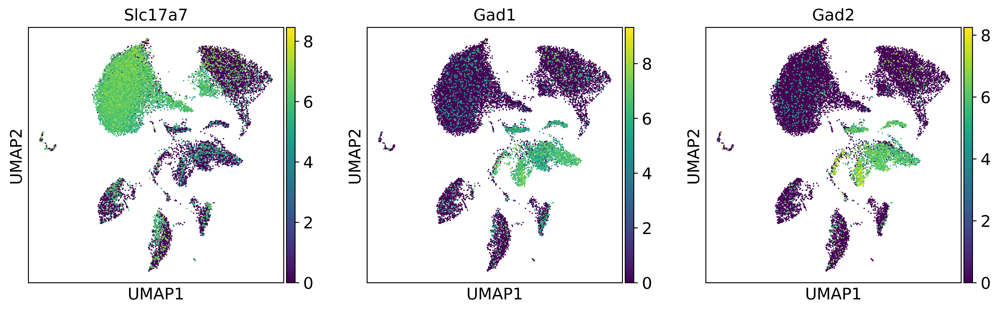

In [23]:
# Visualise GABA marker expression
# UMAP by cluster, sample and donor
sc.set_figure_params(figsize=(6,6))
sc.set_figure_params(dpi=300)
sc.pl.umap(fdata,color=['Slc17a7', 'Gad1', 'Gad2'],legend_loc='on data')

In [ ]:
# rank-based approach -> assumes marker genes should be in the top n of their expressed genes
# threshold -> n cells co-expressing as you increase threshold 
# set a single threshold -> e.g. top 5% -> plot proportions by cluster 

In [ ]:
# permutation approach -> for each cell -> what is the expected co-expression observed in random data
# NB: will bias towards cells that are highly expressed in any one cell -> z score each gene across cells 
#->> ensure that the metric will pay attention to relative values not absolute
# harmonic mean or minimum of normalised
# randomly shuffle n times -> compute null distribution -> p value for each cell -> FDR correction
# plot proportions by cluster

In [46]:
# Visualise co-expression metric on UMAP

#Calculate GLU + GABA + OLI mean exp
gaba_mark1 = gaba_mark
glu_mark1 = glu_mark[0]
print(gaba_mark1, glu_mark1)
gaba_ind = [np.where(fdata.var.index.values == i)[0][0] for i in gaba_mark]
glu_ind = [np.where(fdata.var.index.values == i)[0][0] for i in glu_mark]

##for each cell calculate mean GLU vs GABA expression
fdata.obs['mean_glu']  = np.mean(fdata.X[:,glu_ind],axis=1)
fdata.obs['mean_gaba']  = np.mean(fdata.X[:,gaba_ind],axis=1)
fdata.obs['coX'] = (fdata.obs['mean_glu'] + fdata.obs['mean_gaba'])/2

['Gad2', 'Gad1', 'Slc32a1'] Slc17a7


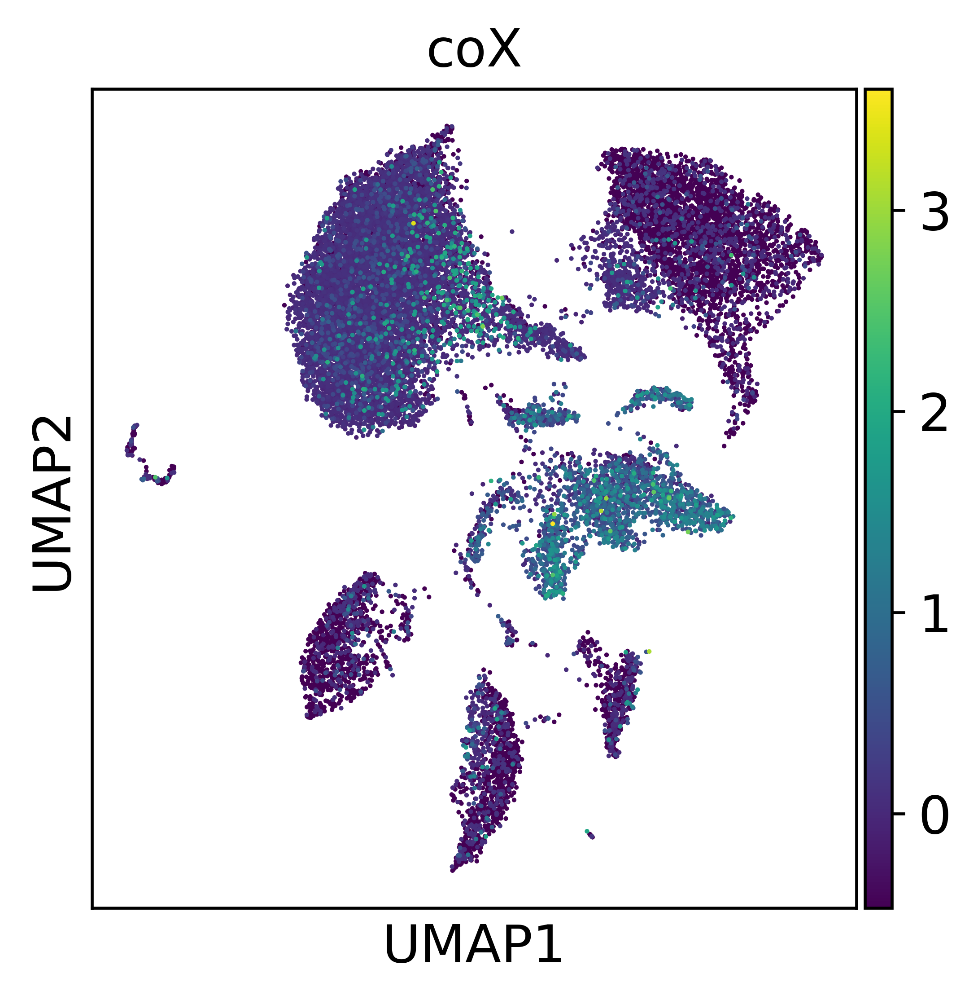

In [47]:
# Plot mean co-expression by cluster
# Visualise GABA marker expression
# UMAP by cluster, sample and donor
sc.set_figure_params(figsize=(6,6))
sc.set_figure_params(dpi=300)
sc.pl.umap(fdata,color=['coX'],legend_loc='on data')


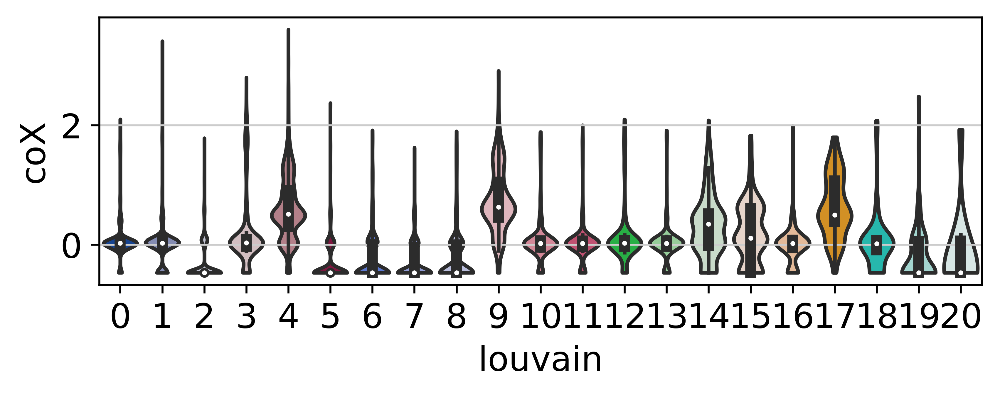

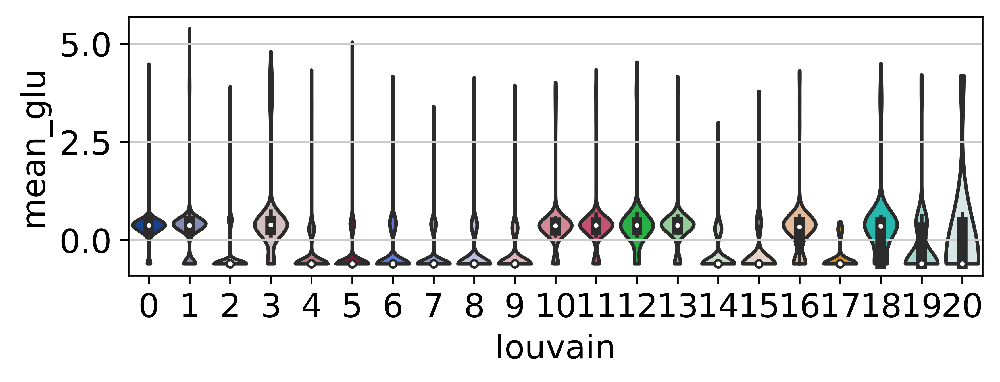

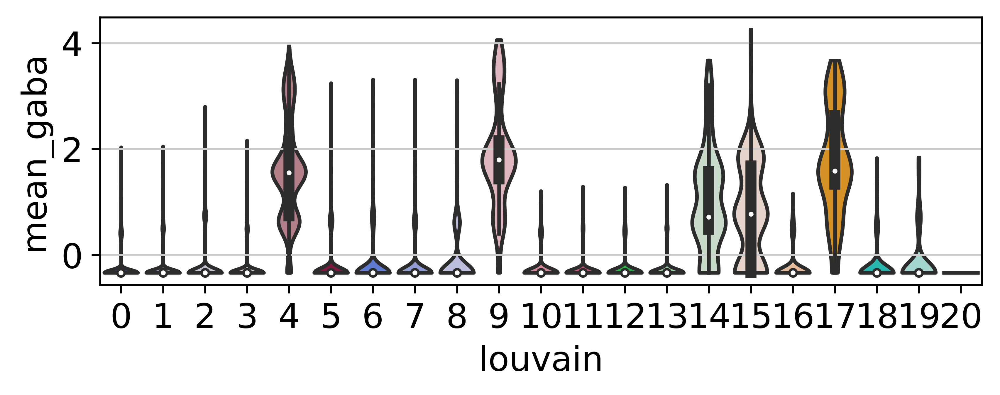

In [49]:
import seaborn as sns
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['coX'], groupby='louvain', stripplot=False, inner='box')  
    
with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['mean_glu'], groupby='louvain', stripplot=False, inner='box')  
    
with rc_context({'figure.figsize': (6, 2)}):
    sc.pl.violin(fdata, ['mean_gaba'], groupby='louvain', stripplot=False, inner='box')  

In [52]:
fdata

AnnData object with n_obs × n_vars = 19519 × 4652
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'louvain', 'mean_glu', 'mean_gaba', 'coX'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [53]:
#celltype annotation

#Save as h5ad for map mycells

#fdata.write('/cndd3/dburrows/DATA/neurotransmitter_switch/processed/pilot/combined/combined-pilot.h5ad')

import anndata as ad

# Assuming 'fdata' is your AnnData object
num_cells = fdata.shape[0]  # Number of cells

# Generate a random boolean mask
mask = np.random.rand(num_cells) < 0.5  # Adjust 0.5 if you need different proportions

# Split the data into two subsets based on the mask
subset1 = fdata[mask]
subset2 = fdata[~mask]

# Save each subset to an .h5ad file
subset1.write('/cndd3/dburrows/DATA/neurotransmitter_switch/processed/pilot/combined/combined-pilot_subset1.h5ad')
subset2.write('/cndd3/dburrows/DATA/neurotransmitter_switch/processed/pilot/combined/combined-pilot_subset2.h5ad')


In [ ]:
# Visualise n cells passing as either as threshold -> 


# Visualise above by cluster -> n cells passing as both

In [ ]:
# figure out a way to estimate double positive


# estimate

In [27]:
#Calculate GLU + GABA + OLI mean exp
gaba_ind = [np.where(fdata.var.index.values == i)[0][0] for i in gaba_mark]
glu_ind = [np.where(fdata.var.index.values == i)[0][0] for i in glu_mark][1:]

##for each cell calculate mean GLU vs GABA expression
fdata.obs['mean_glu']  = np.mean(fdata.X[:,glu_ind],axis=1)
fdata.obs['mean_gaba']  = np.mean(fdata.X[:,gaba_ind],axis=1)

In [41]:
# How many of each celltype do we have?
# Check for increasing threshold

#compute number of co-expressing vs singular as a function of cpm co-expression threshold
glu_vec = []
gaba_vec = []
oli_vec = []
steps = (np.geomspace(0.1,10))

for i in steps:
    glu_vec.append(sum(fdata.obs['mean_glu'].values > i))
    gaba_vec.append(sum(fdata.obs['mean_gaba'].values > i))


In [31]:
steps

array([ 0.1       ,  0.10985411,  0.12067926,  0.13257114,  0.14563485,
        0.15998587,  0.17575106,  0.19306977,  0.21209509,  0.23299518,
        0.25595479,  0.28117687,  0.30888436,  0.33932218,  0.37275937,
        0.40949151,  0.44984327,  0.49417134,  0.54286754,  0.59636233,
        0.65512856,  0.71968567,  0.79060432,  0.86851137,  0.95409548,
        1.04811313,  1.1513954 ,  1.26485522,  1.38949549,  1.52641797,
        1.67683294,  1.84206997,  2.02358965,  2.22299648,  2.44205309,
        2.6826958 ,  2.9470517 ,  3.23745754,  3.55648031,  3.90693994,
        4.29193426,  4.71486636,  5.17947468,  5.68986603,  6.25055193,
        6.86648845,  7.54312006,  8.28642773,  9.10298178, 10.        ])

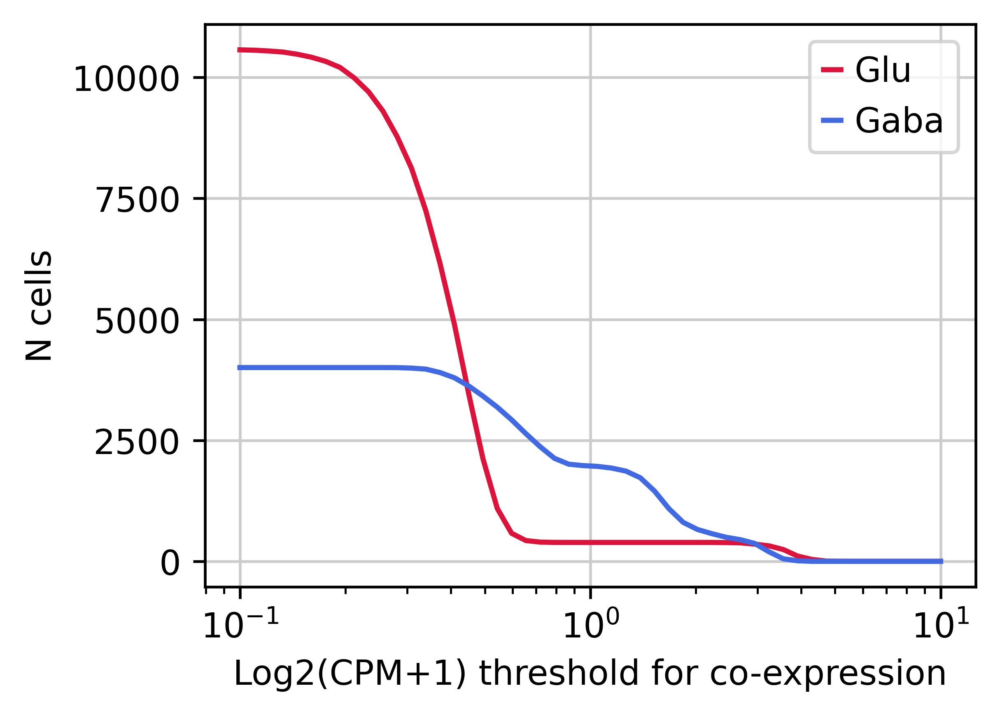

In [43]:
from matplotlib import pyplot as plt

#Plot N cells expressing celltype markers with increasing cutoff
fig,ax = plt.subplots(figsize=(4,3))
plt.plot(steps, glu_vec, label = 'Glu', c='crimson')
plt.plot(steps, gaba_vec, label = 'Gaba', c='royalblue')


plt.xscale('log')
#plt.yscale('log')
plt.legend(fontsize=10)
plt.ylabel('N cells', size=10)
plt.xlabel('Log2(CPM+1) threshold for co-expression', size=10)
plt.xticks(size=10)
plt.yticks(size=10)
#plt.savefig('prac.svg')
plt.show()

In [ ]:
# What fraction of cells are double positive -> per cluster, fraction of all neurons

#cell assignment -> generate null model (stick to pre-defined clusters), how many cells pass cutoff threshold 
#e.g. define key markers; null model, P observing co-expression of Slc17a7 + any other marker gene, -> keep slc17a7 but randomise others
#in randomly shuffled gene expression -> define cutoff
#stringent cutoff